<br>

<h3 style="font-family: Verdana; font-size: 20px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: #FF8C00; background-color: #ffffff;"> <b>DATASET</b> DESCRIPTION</h3>

---

The data include:

* train dataset with game sessions data: `train.csv`
* correct answers for all questions for each session: `train_labels.csv`
* test dataset with game sessions data: `test.csv`
* sample submission file: `sample_submission.csv`


<br>

<h3 style="font-family: Verdana; font-size: 20px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: #FF8C00; background-color: #ffffff;"> <b>EVALUATION</b></h3>

---

This competition has two tracks: the first one focus on the <b>accuracy</b> of the model, and the second one focus on the <b>efficiency</b> of the model
* <b>First track: Accuracy</b>
    * The submissions will be evaluated based on the <a>F1 socre</a>: $2 \frac{precision*recall}{precision+recall}$
* <b>Second track: Efficiency</b>
    * Must be among the submissions selected by a team for the Leaderboard Prize, or else among those submissions automatically selected under the conditions described in the My Submissions tab.
    * Must be ranked on the Private Leaderboard higher than the sample_submission.csv benchmark.
    * Must not have a GPU enabled. <b>The Efficiency Prize is CPU Only</b>.
    * The submissions will be evaluated based on the <a>Efficiency</a>: $\frac{1}{Benchmark-maxF1} + \frac{1}{32400}RuntimeSeconds $

<br>

<a id="imports"></a>

<h1 style="font-family: Verdana; font-size: 24px; font-style: normal; font-weight: bold; text-decoration: none; text-transform: none; letter-spacing: 3px; background-color: #ffffff; color: #FF8C00;">&nbsp;&nbsp;IMPORTS&nbsp;&nbsp;&nbsp;&nbsp;</h1>

In [1]:
# Machine Learning and Data Science Imports
import pandas as pd
import numpy as np

# Built-In Imports
import os
import time
import gc

# Visualization Imports
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
from skimage import io 
try: 
    import mpl_scatter_density # for density scatter graph 
except:
    print("\tPlease install mpl_scatter_density!")
    
# Other Imports
from tqdm.notebook import tqdm # for progress bar
#import jo_wilder # the API of this competition


<br>

<h3 style="font-family: Verdana; font-size: 20px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: #FF8C00; background-color: #ffffff;">HELPER FUNCTIONS</h3>
<br>


In [2]:
# for checking features properties during feature engineering
def check_features(features_df):
    fig, ax = plt.subplots(1, 2, figsize=(18,9))
    fig.tight_layout(pad=10.0)
    sns.boxplot(ax=ax[0], data=features_df, orient="h")
    sns.violinplot(ax=ax[1], data=features_df, orient="h")
    plt.show()

In [3]:
# convert features series into features datafame
def to_df(features_series): 
    features_df = pd.concat(features_series,axis=1)
    features_df = features_df.reset_index()
    features_df = features_df.set_index('session_id')
    return features_df

<br>

<h3 style="font-family: Verdana; font-size: 20px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: #FF8C00; background-color: #ffffff;">LOAD DATA</h3>
<br>


In [4]:
dtypes = {'session_id': 'category',
          'elapsed_time': np.int32,
          'event_name': 'category',
          'name': 'category',
          'level': np.uint8,
          'page': 'category',
          'room_coor_x': np.float32,
          'room_coor_y': np.float32,
          'screen_coor_x': np.float32,
          'screen_coor_y': np.float32,
          'hover_duration': np.float32,
          'text': 'category',
          'fqid': 'category',
          'room_fqid': 'category',
          'text_fqid': 'category',
          'fullscreen': np.int8,
          'hq': np.int8,
          'music': np.int8,
          'level_group': 'category'}

train = pd.read_csv(os.path.join("data/train.csv"), dtype=dtypes)
test = pd.read_csv(os.path.join("data/test.csv"), dtype=dtypes)
train_labels = pd.read_csv(os.path.join("data/train_labels.csv"))


In [5]:
print('Train data shape:', train.shape)
print("Sample of train data:")
train.head()

Train data shape: (26296946, 20)
Sample of train data:


,session_id,index,elapsed_time,event_name,name,level,page,room_coor_x,room_coor_y,screen_coor_x,screen_coor_y,hover_duration,text,fqid,room_fqid,text_fqid,fullscreen,hq,music,level_group
0,20090312431273200,0,0,cutscene_click,basic,0,NaN,-413.991394,-159.314682,380.0,494.0,NaN,undefined,intro,tunic.historicalsociety.closet,tunic.historicalsociety.closet.intro,0,0,1,0-4
1,20090312431273200,1,1323,person_click,basic,0,NaN,-413.991394,-159.314682,380.0,494.0,NaN,"Whatcha doing over there, Jo?",gramps,tunic.historicalsociety.closet,tunic.historicalsociety.closet.gramps.intro_0_...,0,0,1,0-4
2,20090312431273200,2,831,person_click,basic,0,NaN,-413.991394,-159.314682,380.0,494.0,NaN,Just talking to Teddy.,gramps,tunic.historicalsociety.closet,tunic.historicalsociety.closet.gramps.intro_0_...,0,0,1,0-4
3,20090312431273200,3,1147,person_click,basic,0,NaN,-413.991394,-159.314682,380.0,494.0,NaN,I gotta run to my meeting!,gramps,tunic.historicalsociety.closet,tunic.historicalsociety.closet.gramps.intro_0_...,0,0,1,0-4
4,20090312431273200,4,1863,person_click,basic,0,NaN,-412.991394,-159.314682,381.0,494.0,NaN,"Can I come, Gramps?",gramps,tunic.historicalsociety.closet,tunic.historicalsociety.closet.gramps.intro_0_...,0,0,1,0-4


In [6]:
print('Train labels data shape:', train_labels.shape)
print("Sample of train_labels data:")
train_labels.head()

Train labels data shape: (424116, 2)
Sample of train_labels data:


,session_id,correct
0,20090312431273200_q1,1
1,20090312433251036_q1,0
2,20090312455206810_q1,1
3,20090313091715820_q1,0
4,20090313571836404_q1,1


In [7]:
print('Test data shape:', test.shape)
print("Sample of test data:")
test.head()

Test data shape: (3728, 21)
Sample of test data:


,session_id,index,elapsed_time,event_name,name,level,page,room_coor_x,room_coor_y,screen_coor_x,...,hover_duration,text,fqid,room_fqid,text_fqid,fullscreen,hq,music,level_group,session_level
0,20090109393214576,0,0,cutscene_click,basic,0,NaN,-413.991394,75.685310,380.0,...,NaN,undefined,intro,tunic.historicalsociety.closet,tunic.historicalsociety.closet.intro,0,0,1,0-4,0
1,20090109393214576,1,1965,person_click,basic,0,NaN,-105.991402,-63.314686,688.0,...,NaN,"Whatcha doing over there, Jo?",gramps,tunic.historicalsociety.closet,tunic.historicalsociety.closet.gramps.intro_0_...,0,0,1,0-4,0
2,20090109393214576,2,3614,person_click,basic,0,NaN,-418.991394,47.685314,375.0,...,NaN,Just talking to Teddy.,gramps,tunic.historicalsociety.closet,tunic.historicalsociety.closet.gramps.intro_0_...,0,0,1,0-4,0
3,20090109393214576,3,5330,person_click,basic,0,NaN,-110.991402,-57.314686,683.0,...,NaN,I gotta run to my meeting!,gramps,tunic.historicalsociety.closet,tunic.historicalsociety.closet.gramps.intro_0_...,0,0,1,0-4,0
4,20090109393214576,4,6397,person_click,basic,0,NaN,-110.991402,-57.314686,683.0,...,NaN,"Can I come, Gramps?",gramps,tunic.historicalsociety.closet,tunic.historicalsociety.closet.gramps.intro_0_...,0,0,1,0-4,0


<br>

<a id="eda"></a>

<h1 style="font-family: Verdana; font-size: 24px; font-style: normal; font-weight: bold; text-decoration: none; text-transform: none; letter-spacing: 3px; background-color: #ffffff; color: #FF8C00;" id="eda">&nbsp;&nbsp;EXPLORATORY DATA ANALYSIS&nbsp;&nbsp;&nbsp;&nbsp;<a></a></h1>

<br>

<a id="overview"></a>

<h3 style="font-family: Verdana; font-size: 20px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: #FC796D; background-color: #ffffff;"><a style="text-decoration: none; color: #e06f64;" href="#toc">DATASET <b>OVERVIEW</b></a></h3>

---

* each game is a session defined by `session_id`
* each row in the data is a game event, defined by `name`, type (`event_name`), unique ID (`fqid`), and game progress index (`index`)
* the player progresses by moving from one game room (`room_fqid`) and level (`level`) to another
* remaining columns refer to specific events:
    * for click events, the coordinates of the click are defined in `room_coor_x` and `room_coor_y` (in reference to the in-game room) or in `screen_coor_x` and `screen_coor_y` (in reference to the player’s screen).
    * for notebook-related events page identifies the page number;
    * for hover events hover_duration shows how long was the hover.

You can play the game here: https://pbswisconsineducation.org/jowilder/play-the-game/ 
<br>
The game code source is public: https://github.com/fielddaylab/jo_wilder


|No  | Columns name |  Meaning |
|:---| :---         |:---      |
| 1  | <font color="#254441"> session_id </font>  |  the ID of the session the event took place in |
| 2  | <font color="#254441"> index </font>  |  game progress index |
| 3  | <font color="#254441"> elapsed_time </font>  |  how much time has passed (in milliseconds) between the start of the session <br>and when the event was recorded  |
| 4  | <font color="#254441"> event_name </font>  | the name of the event type  |
| 5  | <font color="#254441"> name </font>  |  the event name (e.g. identifies whether a notebook_click is is opening<br> or closing the notebook) |
| 6  | <font color="#254441"> level </font>  |  what level of the game the event occurred in (0 ~ 22)  |
| 7  | <font color="#254441"> page </font>  |   the page number of the event (only for notebook-related events) |
| 8  | <font color="#254441"> room_coor_x </font>  | the coordinates of the click in reference to the in-game room (only for click events)  |
| 9  | <font color="#254441"> room_coor_y </font>  |  the coordinates of the click in reference to the in-game room (only for click events) |
| 10  | <font color="#254441"> screen_coor_x </font>  | the coordinates of the click in reference to the player’s screen (only for click events)  |
| 11  | <font color="#254441"> screen_coor_y </font>  |  the coordinates of the click in reference to the player’s screen (only for click events) |
| 12  | <font color="#254441"> hover_duration </font>  |  how long (in milliseconds) the hover happened for (only for hover events) |
| 13  | <font color="#254441"> text </font>  | the text the player sees during this event  |
| 14  | <font color="#254441"> fqid  </font>  | the fully qualified ID of the event  |
| 15  | <font color="#254441"> room_fqid  </font>  | the fully qualified ID of the room the event took place in  |
| 16 | <font color="#254441">  text_fqid </font>  |  the fully qualified ID of the text the player sees |
| 17  | <font color="#254441">  fullscreen  </font>  |  whether the player is in fullscreen mode |
| 18  | <font color="#254441">  hq  </font>  |  whether the game is in high-quality |
| 19  | <font color="#254441">  music </font>  |   whether the game music is on or off |
| 20  | <font color="#254441"> level_group  </font>  | which group of levels - and group of questions - this row belongs to (0-4, 5-12, 13-22)  |

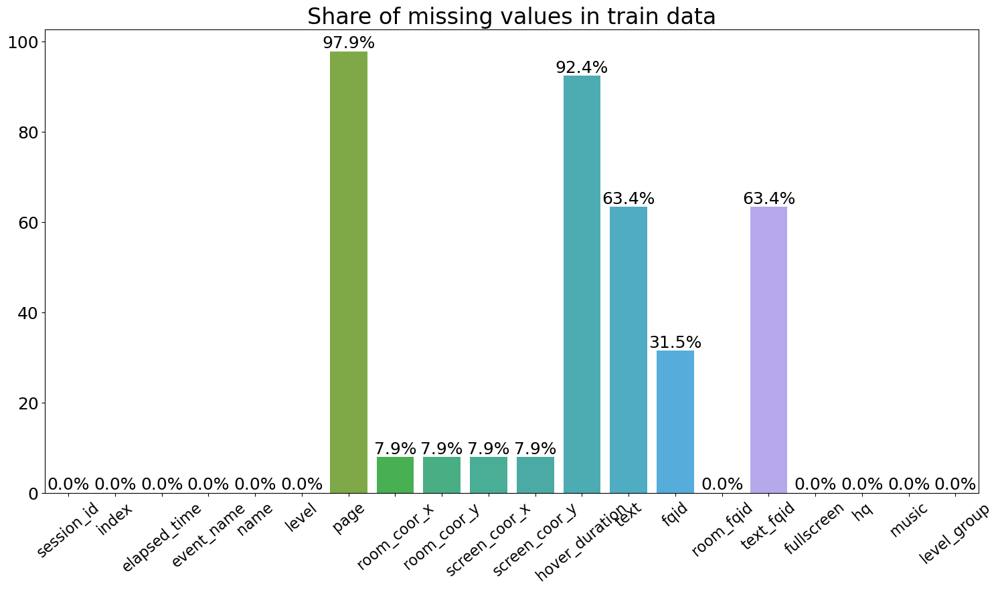

In [8]:
train_missing = train.isna().sum() / len(train) *100
train_missing_index = train_missing.index
train_missing_values = train_missing.values

fig, ax = plt.subplots(figsize=(18, 9))
barchart = sns.barplot(x = train_missing_index, y = train_missing_values, ax = ax)
barchart.axes.set_title("Share of missing values in train data", fontsize=24, loc = 'center')
barchart.bar_label(barchart.containers[0], fmt="%.1f%%", fontsize=18)
barchart.yaxis.set_tick_params(labelsize = 18)
barchart.xaxis.set_tick_params(rotation=40, labelsize = 16)
plt.show()

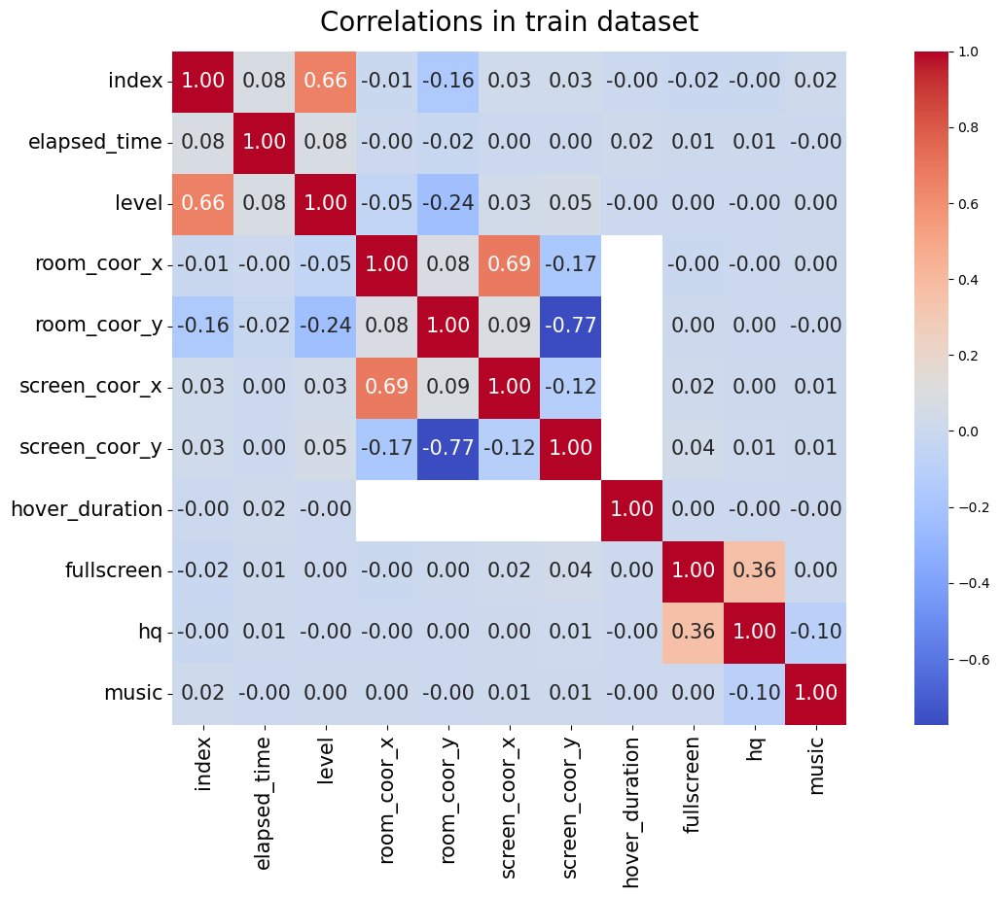

In [9]:
plt.figure(figsize=(18, 9))
g = sns.heatmap(train.corr(), annot=True, square=True, cmap='coolwarm', annot_kws={'size': 15},fmt='.2f')
g.tick_params(axis='x', labelsize=15)
g.tick_params(axis='y', labelsize=15)
g.set_title('Correlations in train dataset', size=20, pad=15)
plt.show()

del g

<br>

<a id="session_id"></a>


<h3 style="font-family: Verdana; font-size: 20px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: #FC796D; background-color: #ffffff;"><a style="text-decoration: none; color: #e06f64;" href="#toc">5.1 EXAMINE <b>`SESSION_ID`</b> COLUMN</a></h3>

---
* `session_id` is the ID of the session the event took place in. 
* There are 23562 unique sessions in the train dataset

In [10]:
train_events_counts = train['session_id'].value_counts()
print(f"\n The number of unique session in train set: {len(train_events_counts)}")


 The number of unique session in train set: 23562


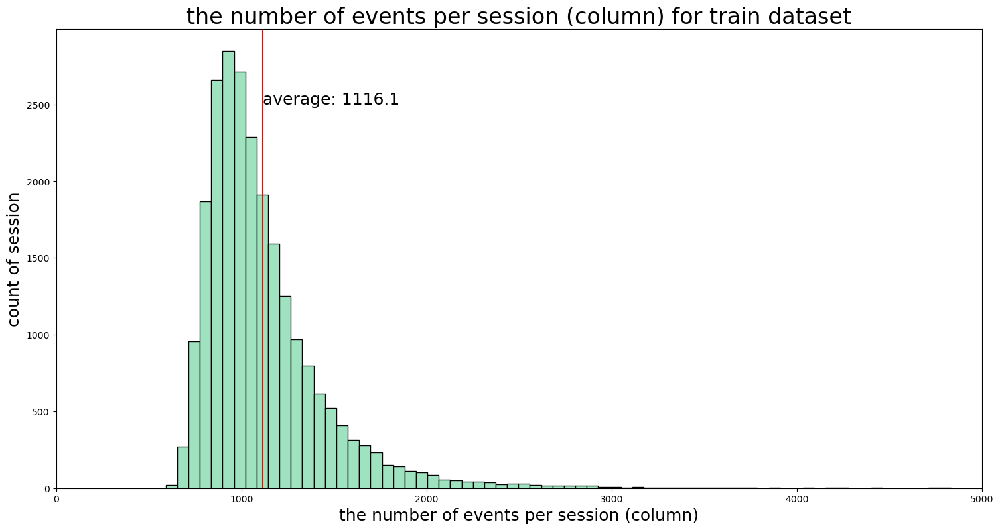

In [11]:
events_counts = train_events_counts.values

plt.figure(figsize=(18, 9))
plt.hist(events_counts, edgecolor="black", bins=300, color = "#9FE2BF")
plt.xlim(xmin=0, xmax = 5000)
plt.title("the number of events per session (column) for train dataset", fontsize=24)
plt.xlabel("the number of events per session (column)", fontsize=18)
plt.ylabel("count of session", fontsize=18)
plt.axvline(events_counts.mean(), color='r')
plt.text(events_counts.mean(), 2500, f'average: {events_counts.mean():.1f}', fontsize=18)
plt.show()

<br>

<a id = 'index'></a>

<h3 style="font-family: Verdana; font-size: 20px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: #FC796D; background-color: #ffffff;"><a style="text-decoration: none; color: #e06f64;" href="#toc">5.2 EXAMINE <b>`INDEX`</b> COLUMN</a></h3>

---
* `index` is the index of the event for each session
* The index is not very clean for train dataset and test dataset
    * some sessions have duplicate index
    * some sessions have no `index == 0` (start of the game)
    * some sessions have reversed index
    * some sessions have jump index

For more information, you can refer to <a href = 'https://www.kaggle.com/code/abaojiang/eda-on-game-progress'>this notebook</a>, it has a detailed exploration to the duplicate index, reversed index, jump index.

In [12]:
idx = train[['session_id', 'index']]
idx_dupl = idx[idx.duplicated()]
print(f"\n{len(idx_dupl)}/{len(train)} {len(idx_dupl)/len(train) * 10000:.1f}%% of the `session_id` and `index` pairs are dulicapted")

del idx, idx_dupl


34534/26296946 13.1%% of the `session_id` and `index` pairs are dulicapted


<br>

<a id = "time"></a>

<h3 style="font-family: Verdana; font-size: 20px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: #FC796D; background-color: #ffffff;"><a style="text-decoration: none; color: #e06f64;" href="#toc">5.3 EXAMINE <b>`ELAPSED_TIME`</b> COLUMN</a></h3>



---
* `elapsed_time` is how much time has passed (in milliseconds) between the start of the session and when the event was recorded


In [13]:
elapsed_time_train = np.round((train['elapsed_time']).astype(np.float64)/60000.0, 1)
elapsed_time_test = np.round((test['elapsed_time']).astype(np.float64)/60000.0, 1)

stat = pd.DataFrame([elapsed_time_train.describe().index,
                    np.round(elapsed_time_train.describe(), 2).values,
                    np.round(elapsed_time_test.describe(), 2).values]).T
stat.columns = [' ', 'train', 'test']
stat[['train', 'test']] = stat[['train', 'test']].astype(np.float64)
print('The statistics of `elapsed_time` column:')
stat[1:].style.hide_index().format(precision=1).background_gradient()

The statistics of `elapsed_time` column:


C:\Users\baben_bakg1j1\AppData\Local\Temp\ipykernel_18480\2011585212.py:10: FutureWarning: this method is deprecated in favour of `Styler.hide(axis='index')`
  stat[1:].style.hide_index().format(precision=1).background_gradient()


,train,test
mean,66.9,34.4
std,521.2,34.7
min,0.0,0.0
25%,7.3,9.5
50%,16.9,19.6
75%,29.1,41.4
max,33143.4,108.7


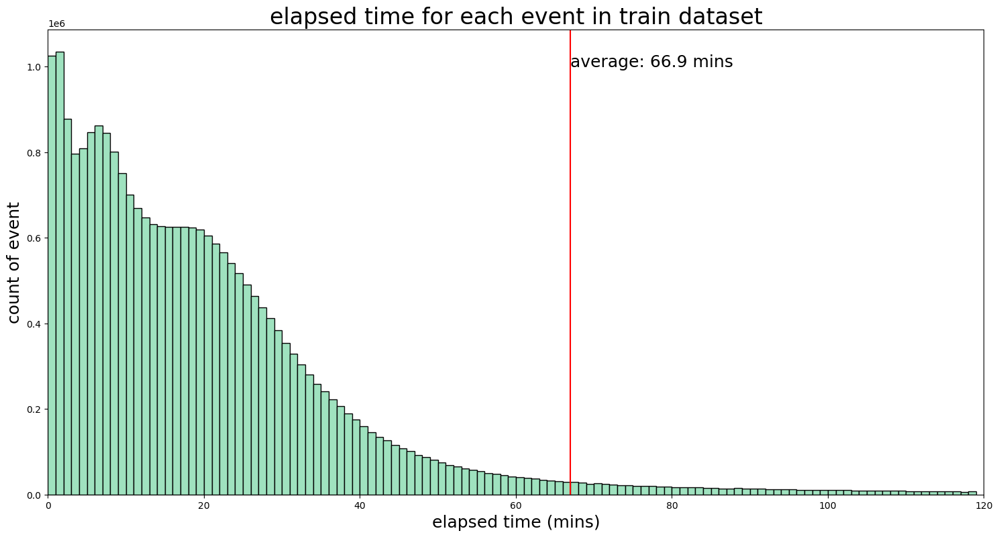

In [14]:
mean_elapsed_time_train = elapsed_time_train.mean()

plt.figure(figsize=(18, 9))
plt.hist(elapsed_time_train, edgecolor="black", bins=range(0, 120, 1), color = "#9FE2BF")
plt.xlim(0, 120)
plt.title("elapsed time for each event in train dataset", fontsize=24)
plt.xlabel("elapsed time (mins)", fontsize=18)
plt.ylabel("count of event", fontsize=18)
plt.axvline(mean_elapsed_time_train, color='r')
plt.text(mean_elapsed_time_train, 10**6, f'average: {mean_elapsed_time_train:.1f} mins', fontsize=18)
plt.show()

del mean_elapsed_time_train, elapsed_time_train, elapsed_time_test

<br>

<a id = 'event_name'><a>

<h4 style="font-family: Verdana; font-size: 20px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: #FC796D; background-color: #ffffff;"><a style="text-decoration: none; color: #e06f64;" href="#toc">5.3 EXAMINE <b>`EVENT_NAME`</b> AND <b>`NAME`</b> COLUMN</a></h4>

---
* `event_name` is the the name of the event type. 
    * It has 11 unique values (including cutscene_click, person_click, navigate_click, navigate_click, notification_click, object_click, object_hover, map_hover, map_click, checkpoint, and notebook_click)
    * You can have a detailed udnderstanding of the meaning of those event_name in this <a href = "https://www.kaggle.com/code/demche/student-performance-from-game-play-eda">notebook</a>
* `name` is the name of event
    * It has 6 unique values (including basic, underfined, close, open, prev, and next)
    
For more information, you can refer to <a href = "https://www.kaggle.com/code/shashwatraman/meaning-of-each-event-name-and-eda">this notebook</a>, it has a detailed exploration on the meaning of each `event_name`.



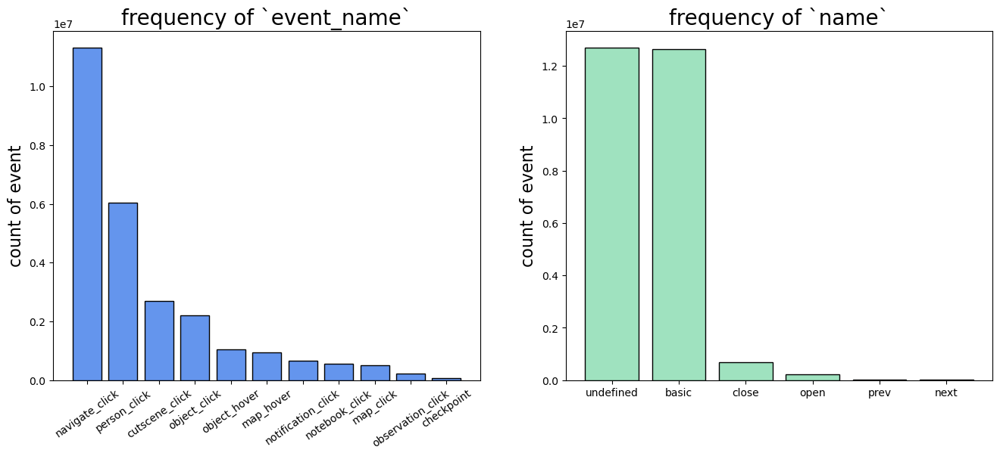

In [15]:
plt.figure(figsize=(16, 6))

plt.subplot(1, 2, 1)
event_name = train["event_name"].value_counts()
plt.bar(event_name.index, event_name.values, edgecolor="black", color = "#6495ED")
plt.xticks(rotation = 35)
plt.title("frequency of `event_name`", fontsize = 20)
plt.ylabel("count of event", fontsize = 16)

plt.subplot(1, 2, 2)
name = train["name"].value_counts()
plt.bar(name.index, name.values, edgecolor="black", color = "#9FE2BF")
plt.title("frequency of `name`", fontsize = 20)
plt.ylabel("count of event", fontsize = 16)

plt.show()

del event_name, name

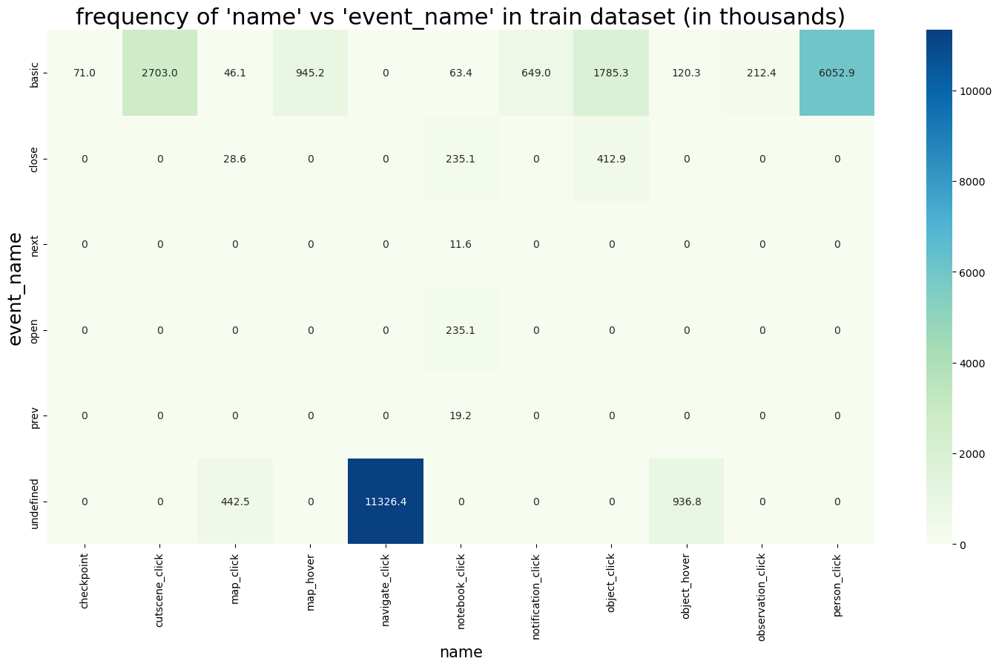

In [16]:
pivot = train.pivot_table(index='name', columns='event_name', aggfunc='size')
pivot = (pivot.fillna(0) / 1000).round(decimals = 1)
plt.figure(figsize=(18, 9))
annotations = pivot.astype(str)
annotations[pivot == 0] = "0"
g = sns.heatmap(pivot, annot=annotations, fmt='', cmap='GnBu')
plt.title("frequency of 'name' vs 'event_name' in train dataset (in thousands)", fontsize=22)
plt.xlabel("name", fontsize = 15)
plt.ylabel("event_name", fontsize = 18)
plt.show()

del pivot, g

<br>

<a id = 'level'></a>

<h3 style="font-family: Verdana; font-size: 20px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: #FC796D; background-color: #ffffff;"><a style="text-decoration: none; color: #e06f64;" href="#toc">5.5 EXAMINE LEVEL PROPERTIES: <b>`LEVEL`</b> AND <b>`LEVEL_GROUP`</b> COLUMN</a></h3>



---
* `level` is what level event in the game (0 to 22).
* `level_group` is which group of levels this level belongs to (0-4, 5-12, 13-22)

<Figure size 1800x1200 with 0 Axes>

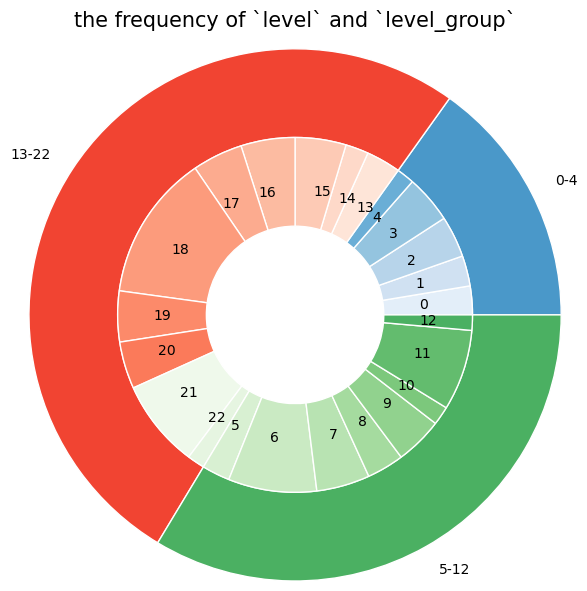

In [17]:
outer = train.groupby(by = 'level_group')['session_id'].count()
inner = train.groupby(by = ['level_group', 'level'])['session_id'].count()
inner = inner[inner != 0]
# inner_labels = inner.index.get_level_values(1)


plt.figure(figsize=(18, 12))

# Make data
group_names=outer.index
group_size=outer.values
subgroup_names = inner.index.get_level_values(1)
subgroup_size=inner.values

# Create colors
a, b, c=[plt.cm.Blues, plt.cm.Reds, plt.cm.Greens]
 
# First Ring (outside)
fig, ax = plt.subplots()
ax.axis('equal')
mypie, _ = ax.pie(group_size, radius=1.8, labels=group_names, colors=[a(0.6), b(0.6), c(0.6)])
plt.setp( mypie, width=0.6, edgecolor='white')
 
# Second Ring (Inside)
mypie2, _ = ax.pie(subgroup_size, radius=1.8-0.6, labels=subgroup_names, labeldistance=0.7, 
                   colors=[a(0.1), a(0.2), a(0.3), a(0.4), a(0.5),
                           b(0.1), b(0.15), b(0.2), b(0.25), b(0.3), b(0.35), b(0.4), b(0.45), 
                           c(0.06 * 1), c(0.06 * 2), c(0.06 * 3), c(0.06 * 4), c(0.06 * 5), 
                           c(0.06 * 6), c(0.06 * 7), c(0.06 * 8), c(0.06 * 9), c(0.06 * 10), c(0.06 * 11), c(0.06 * 12)  ])
plt.setp( mypie2, width=0.6, edgecolor='white')

plt.text(0.5, 1.28, "the frequency of `level` and `level_group`",
         horizontalalignment='center',
         fontsize=15,
         transform = ax.transAxes)

plt.show()

At levels 4, 12, 22 the game has checkpoint events when questions are being asked.

The number of questions in each level_group is fixed:


|level_group|questions|number of questions|
|:---| :---         |:---      |
|0-4|q1 to q3|3|
|5-12|q4 to q13|10
|13-22|q14 to q18|5|

There are sessions in which one of the 22 levels is not present.

#### <br>

<a id = 'page'></a>

<h3 style="font-family: Verdana; font-size: 20px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: #FC796D; background-color: #ffffff;"><a style="text-decoration: none; color: #e06f64;" href="#toc">5.6 EXAMINE <b>`PAGE`</b> COLUMN</a></h3>



---
* `page` is the number of the event 
* `page` is only applicable for notebook-related events

In [18]:
page = train[~train["page"].isna()]
print(f"\nonly {len(page)} of `page` in train dataset is not NaN, it accounts for {len(page)/len(train)*100:.1f}% of the whole train dataset")


only 564544 of `page` in train dataset is not NaN, it accounts for 2.1% of the whole train dataset


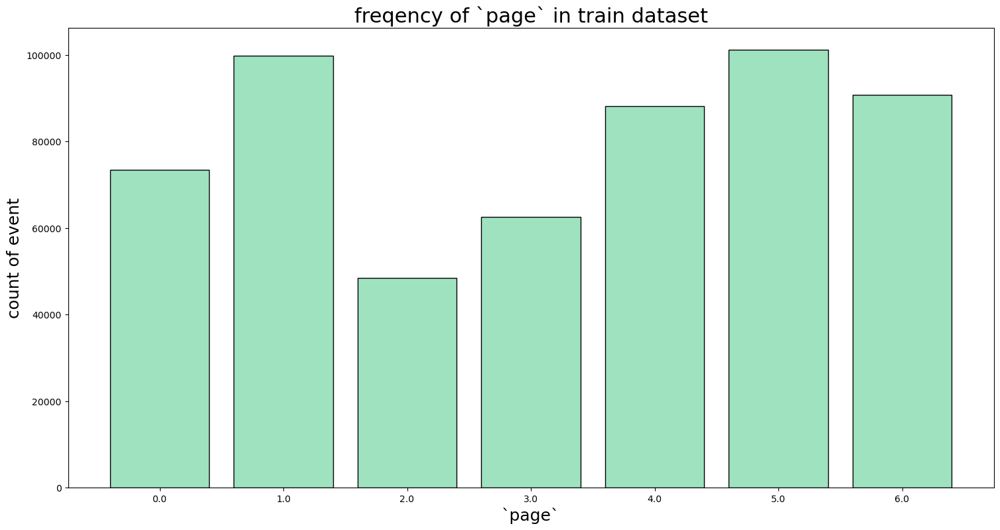

In [19]:
page_piv = page.groupby("page")["session_id"].count()


plt.figure(figsize=(18, 9))
plt.bar(page_piv.index, page_piv.values, edgecolor="black", color = "#9FE2BF")
plt.title("freqency of `page` in train dataset", fontsize=22)
plt.xlabel("`page`", fontsize=18)
plt.ylabel("count of event", fontsize=18)
plt.show()

del page, page_piv

#### <br>

<a id = 'loc'></a>

<h3 style="font-family: Verdana; font-size: 20px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: #FC796D; background-color: #ffffff;"><a style="text-decoration: none; color: #e06f64;" href="#toc">5.7 EXAMINE <b>GEO-LOCATION</b> PROPERTIES</a></h3>

---

* `room_coor_x` is the coordinates of the click in reference to the in-game room (only for click events)
* `room_coor_y` is the coordinates of the click in reference to the in-game room (only for click events)
* `screen_coor_x` is the coordinates of the click in reference to the player’s screen (only for click events)
* `screen_coor_y` is the coordinates of the click in reference to the player’s screen (only for click events)
* 92.1% of the geo-location data in train dataset is not NaN

For more information, you can refer to those notebooks below:
* <a href = "https://www.kaggle.com/competitions/predict-student-performance-from-game-play/discussion/387864">This notebook</a> tells how deo-location data is stored when you play the game.
* <a href = "https://www.kaggle.com/code/janmpia/person-clicks-eda-features">This notebook</a> exlopred the relationship between geo-location data and useful clue in the game, it may be useful for feature engineering.
* <a href = "https://www.kaggle.com/code/vassylkorzh/play-game-session?scriptVersionId=119784646">This notebook</a> has an interactive view on clicks: it allows you to select a session and watch the session click events at each stage of the game.

In [20]:
coor = train[~train["room_coor_x"].isna()]
print(f"\n{len(coor)} of the geo-location data in train dataset is not NaN, it accounts for {len(coor)/len(train)*100:.1f}% of the whole train dataset")


24223674 of the geo-location data in train dataset is not NaN, it accounts for 92.1% of the whole train dataset


To make the geo-location data easily understood, we need click density for each specific room, it shows the locations of important objects or characters.

C:\Users\baben_bakg1j1\anaconda3\lib\site-packages\mpl_scatter_density\generic_density_artist.py:77: RuntimeWarning: All-NaN slice encountered
  vmin = self._density_vmin(array)
C:\Users\baben_bakg1j1\anaconda3\lib\site-packages\mpl_scatter_density\generic_density_artist.py:82: RuntimeWarning: All-NaN slice encountered
  vmax = self._density_vmax(array)


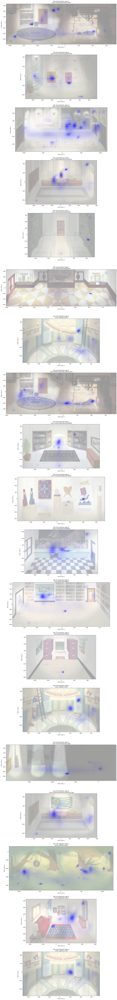

In [21]:
room_ids = train["room_fqid"].unique().tolist()

fig = plt.figure(figsize=(18, 9 * len(room_ids)))

room_id = "tunic.historicalsociety.closet"
temp = train[train["room_fqid"] == room_id]

for i in range(len(room_ids)):
    room_id = room_ids[i]
    temp = train[train["room_fqid"] == room_id]
    ax = fig.add_subplot(len(room_ids) + 1,1, i + 1, projection='scatter_density')
    image = io.imread(f"https://raw.githubusercontent.com/zhangyue325/my_warehouse/main/{room_id}.png")
    ax.imshow(image, 
              extent=[temp["room_coor_x"].min(), 
                      temp["room_coor_x"].max(), 
                      temp["room_coor_y"].min(),
                      temp["room_coor_y"].max()], 
              alpha = 0.4)
    ax.title.set_text(f'the click density map in\n {room_id}')
    ax.set_ylabel('room_coor_y')
    ax.set_xlabel('room_coor_x')
    x = temp["room_coor_x"]
    y = temp["room_coor_y"]
    ax.scatter_density(x, y, color='blue', downres_factor = 1)


#### <br>

<a id = 'hover'></a>

<h3 style="font-family: Verdana; font-size: 20px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: #FC796D; background-color: #ffffff;"><a style="text-decoration: none; color: #e06f64;" href="#toc">5.8 EXAMINE <b>`HOVER_DURATION`</b> COLUMN</a></h3>


    
    
---
* `hover_duration` is how long (in milliseconds) the hover happened for (only for hover events)
* `hover_duration` is applicable when `event_name` is `object_hover` or `map_hover`

In [22]:
hover = train[~train["hover_duration"].isna()]
print(f"\n{len(hover)} of the geo-location data in train dataset is not NaN, it accounts for {len(hover)/len(train)*100:.1f}% of the whole train dataset")
object_hover = hover[hover["event_name"] == "object_hover"]
map_hover = hover[hover["event_name"] == "map_hover"]

print(f"{len(object_hover)/len(hover)*100:.1f}% of the hover event is object_hover, and {100 - len(object_hover)/len(hover)*100:.1f}% of the hover event is map_hover")


2002244 of the geo-location data in train dataset is not NaN, it accounts for 7.6% of the whole train dataset
52.8% of the hover event is object_hover, and 47.2% of the hover event is map_hover


In [23]:
object_hover = np.round((object_hover['hover_duration']).astype(np.float64)/1000.0, 1)
map_hover = np.round((map_hover['hover_duration']).astype(np.float64)/1000.0, 1)

stat = pd.DataFrame([object_hover.describe().index,
                    np.round(object_hover.describe(), 2).values,
                    np.round(map_hover.describe(), 2).values]).T
stat.columns = [' ', 'object hover', 'map hover']
stat[['object hover', 'map hover']] = stat[['object hover', 'map hover']].astype(np.float64)
print('The statistics of `object_hover` and `map_hover` (in second):')
stat[1:].style.hide_index().format(precision=1).background_gradient()

The statistics of `object_hover` and `map_hover` (in second):


C:\Users\baben_bakg1j1\AppData\Local\Temp\ipykernel_18480\1431573183.py:10: FutureWarning: this method is deprecated in favour of `Styler.hide(axis='index')`
  stat[1:].style.hide_index().format(precision=1).background_gradient()


,object hover,map hover
mean,5.4,1.3
std,530.8,365.4
min,0.0,0.0
25%,0.2,0.1
50%,0.9,0.2
75%,3.2,0.6
max,245163.7,239792.4


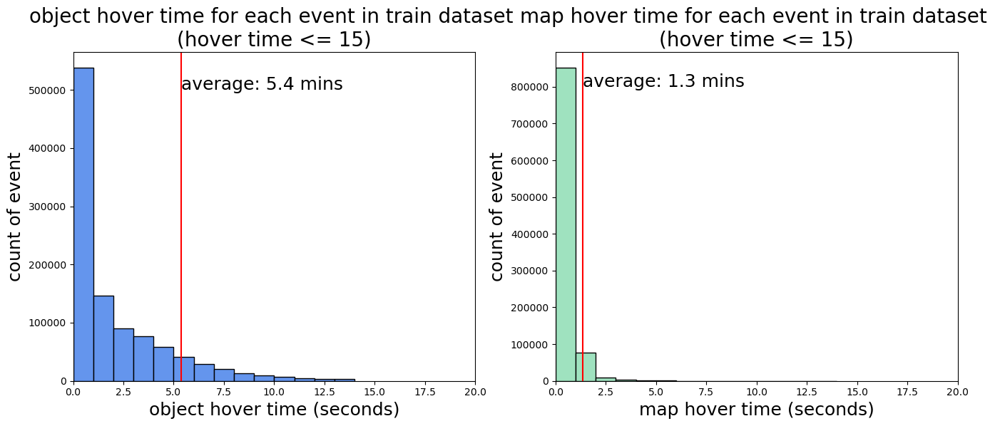

In [24]:
plt.figure(figsize=(16, 6))

plt.subplot(1, 2, 1)
plt.hist(object_hover, edgecolor="black", bins=range(0, 15, 1), color = "#6495ED")
plt.xlim(0, 20)
plt.title(f"object hover time for each event in train dataset \n(hover time <= 15)", fontsize=20)
plt.xlabel("object hover time (seconds)", fontsize=18)
plt.ylabel("count of event", fontsize=18)
plt.axvline(object_hover.mean(), color='r')
plt.text(object_hover.mean(), 5* 10**5, f'average: {object_hover.mean():.1f} mins', fontsize=18)

plt.subplot(1, 2, 2)
plt.hist(map_hover, edgecolor="black", bins=range(0, 15, 1), color = "#9FE2BF")
plt.xlim(0, 20)
plt.title(f"map hover time for each event in train dataset \n(hover time <= 15)", fontsize=20)
plt.xlabel("map hover time (seconds)", fontsize=18)
plt.ylabel("count of event", fontsize=18)
plt.axvline(map_hover.mean(), color='r')
plt.text(map_hover.mean(), 8* 10**5, f'average: {map_hover.mean():.1f} mins', fontsize=18)

plt.show()

In [25]:
print("Some players may stop to play the game during object hover or map hover, so their hover time are extremely long.")
print(f"{len(object_hover[object_hover>60])/len(object_hover) * 10000:.2f}%% player's object hover time larger than 1 minute. {len(map_hover[map_hover>60])/len(map_hover) * 10000:.2f}%%  player's map hover time larger than 1 minute. ")
print(f"{len(object_hover[object_hover>60*10])/len(object_hover) * 10000:.2f}%% player's object hover time larger than 10 minutes.  {len(map_hover[map_hover>60 * 10])/len(map_hover) * 10000:.2f}%% player's map hover time larger than 10 minutes.")

Some players may stop to play the game during object hover or map hover, so their hover time are extremely long.
9.95%% player's object hover time larger than 1 minute. 2.12%%  player's map hover time larger than 1 minute. 
1.90%% player's object hover time larger than 10 minutes.  0.35%% player's map hover time larger than 10 minutes.


#### <br>

<a id = 'text'></a>

<h3 style="font-family: Verdana; font-size: 20px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: #FC796D; background-color: #ffffff;"><a style="text-decoration: none; color: #e06f64;" href="#toc">5.9 EXAMINE <b>`TEXT`</b> AND <b>`TEXT_FQID`</b> COLUMN</a></h3>

---
* `text` is the the text the player sees during this event
* `text_fqid` is the fully qualified ID of the text the player sees. If the `text_fqid` is not null, it is the concretration of `fqid` (person/object the player is interacting with), `room_fqid` (game room), and the id of text (for example: .intro_0_cs_0)

In [26]:
print(f"\nIn train daset, {(~train['text'].isna()).sum()} `text` of events are not NaN. It accounts for {100 - train['text'].isna().sum() / len(train) * 100:.1f}% of the whole train dataset.")
print(f"In train daset, {(~train['text_fqid'].isna()).sum()} `text_fqid` of events are not NaN. It accounts for {100 - train['text_fqid'].isna().sum() / len(train) * 100:.1f}% of the whole train dataset.")


In train daset, 9617139 `text` of events are not NaN. It accounts for 36.6% of the whole train dataset.
In train daset, 9617244 `text_fqid` of events are not NaN. It accounts for 36.6% of the whole train dataset.


In [27]:
print("\nAll the event whose `text` is not NaN, its `text_fqid` is also not NaN.")
print(f'The number of events whose `text` is not NaN but `text_fqid` is NaN: {train[~(train["text"].isna()) & (train["text_fqid"].isna())]["text"].count()}.')

print("\nThere are some events whose `text-fqid` is not NaN, but `text` is NaN.")
print(f'The number of events whose `text` is not NaN but `test` is NaN: {train[~(train["text_fqid"].isna()) & (train["text"].isna())]["text_fqid"].count()}.')

print(f"\nThis is a sample of event whose `text` is not NaN but `text` is NaN.")
pd.set_option('display.width', 1000)
train[(train["text"].isna()) & ~(train["text_fqid"].isna())][["text", "text_fqid"]]


All the event whose `text` is not NaN, its `text_fqid` is also not NaN.
The number of events whose `text` is not NaN but `text_fqid` is NaN: 0.

There are some events whose `text-fqid` is not NaN, but `text` is NaN.
The number of events whose `text` is not NaN but `test` is NaN: 105.

This is a sample of event whose `text` is not NaN but `text` is NaN.


,text,text_fqid
299422,NaN,tunic.historicalsociety.entry.gramps.hub
660031,NaN,tunic.historicalsociety.entry.gramps.hub
1727007,NaN,tunic.historicalsociety.entry.directory.closeu...
1727008,NaN,tunic.historicalsociety.entry.directory.closeu...
1806929,NaN,tunic.historicalsociety.stacks.journals_flag.p...
...,...,...
24318098,NaN,tunic.historicalsociety.entry.gramps.hub
24437716,NaN,tunic.historicalsociety.entry.gramps.hub
24980707,NaN,tunic.historicalsociety.entry.gramps.hub
25143348,NaN,tunic.historicalsociety.entry.gramps.hub


In [28]:
print(f'\nIn train dataset, we have {train["text"].nunique()} unique `text`.')
print(f'In train dataset, we have {train["text_fqid"].nunique()} unique `text_fqid`.')
print("\nThe relationship between `text` and `text_fqid` is N:N")


In train dataset, we have 597 unique `text`.
In train dataset, we have 126 unique `text_fqid`.

The relationship between `text` and `text_fqid` is N:N


In [29]:
print("\nThe top 10 frequency `text` are:")
t = train.groupby(by = ["text"])["session_id"].count()
t = t.sort_values(ascending=False).head(10).to_frame().reset_index()
t = t.rename(columns={"session_id": "frequency of event"})
t.style.format(precision=0)


The top 10 frequency `text` are:


,text,frequency of event
0,undefined,355969
1,\u00f0\u0178\u02dc\u0090,48805
2,Hey!,47452
3,I should go to the Capitol and tell Mrs. M!,40463
4,This is perfect for the exhibit.,40218
5,Look at all those activists!,40215
6,"If I were you, I'd go to the library and do some digging.",39248
7,Ugh. Fine.,36009
8,\u00f0\u0178\u02dc\u00b4,35654
9,You can talk to a textile expert there.,35202


In [30]:
print("\nThe top 10 frequency `text_fqid` are:")
t = train.groupby(by = ["text_fqid"])["session_id"].count()
t = t.sort_values(ascending=False).head(10).to_frame().reset_index()
t = t.rename(columns={"session_id": "frequency of event"})
t.style.format(precision=0)


The top 10 frequency `text_fqid` are:


,text_fqid,frequency of event
0,tunic.historicalsociety.cage.confrontation,666557
1,tunic.wildlife.center.crane_ranger.crane,470755
2,tunic.historicalsociety.frontdesk.archivist.newspaper,429762
3,tunic.historicalsociety.entry.groupconvo,427180
4,tunic.wildlife.center.wells.nodeer,399967
5,tunic.historicalsociety.frontdesk.archivist.have_glass,394908
6,tunic.drycleaner.frontdesk.worker.hub,362883
7,tunic.historicalsociety.closet_dirty.gramps.news,334439
8,tunic.humanecology.frontdesk.worker.intro,300110
9,tunic.historicalsociety.frontdesk.archivist_glasses.confrontation,263308


#### <br>

<a id = 'game_config'></a>

<h3 style="font-family: Verdana; font-size: 20px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: #FC796D; background-color: #ffffff;"><a style="text-decoration: none; color: #e06f64;" href="#toc">5.10 EXAMINE GAME CONFIG: <b>`FULLSCREEN`</b>, <b>`HQ`</b>, AND <b>`MUSIC`</b> COLUMN</a>N</h3>



---
* `fullscreen` is whether the player is in fullscreen mode
* `hq` is whether the game is in high-quality
* `music` is whether the game music is on or off

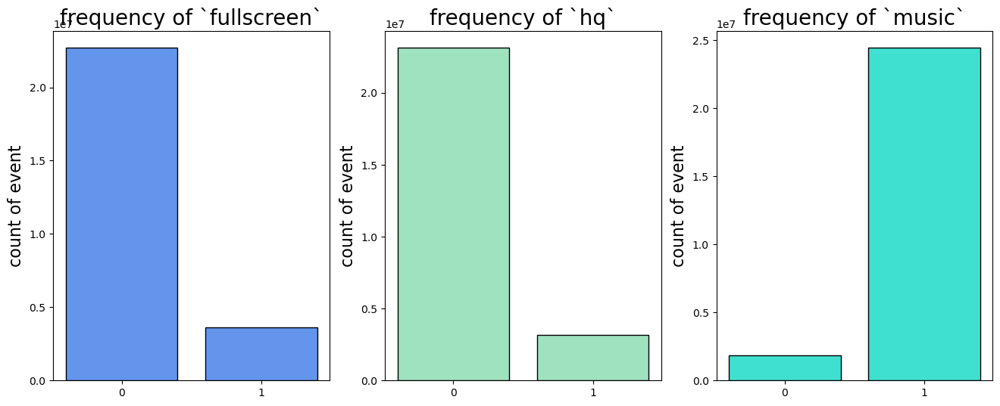

In [31]:
plt.figure(figsize=(16, 6))

plt.subplot(1, 3, 1)
fullscreen = train["fullscreen"].value_counts()
plt.bar(fullscreen.index, fullscreen.values, edgecolor="black", color = "#6495ED")
plt.title("frequency of `fullscreen`", fontsize = 20)
plt.ylabel("count of event", fontsize = 16)
plt.xticks(ticks = [0, 1])

plt.subplot(1, 3, 2)
hq = train["hq"].value_counts()
plt.bar(hq.index, hq.values, edgecolor="black", color = "#9FE2BF")
plt.title("frequency of `hq`", fontsize = 20)
plt.ylabel("count of event", fontsize = 16)
plt.xticks(ticks = [0, 1])

plt.subplot(1, 3, 3)
music = train["music"].value_counts()
plt.bar(music.index, music.values, edgecolor="black", color = "#40E0D0")
plt.title("frequency of `music`", fontsize = 20)
plt.ylabel("count of event", fontsize = 16)
plt.xticks(ticks = [0, 1])

plt.show()

Most of the players turned on music, and disabled fullscreen and high-quality as default.

In [32]:
for col in ['fullscreen', 'hq', "music"]:
    piv = train.groupby(['session_id', col])["index"].count()
    piv = piv[piv != 0]
    session = piv.index.get_level_values(0)
    switched_music_amt = session.duplicated(keep='first').sum()
    print(f"{switched_music_amt} player has switched {col} during playing the game")

0 player has switched fullscreen during playing the game
0 player has switched hq during playing the game
0 player has switched music during playing the game


<br>

<a id="feature_engineering"></a>

<h1 style="font-family: Verdana; font-size: 24px; font-style: normal; font-weight: bold; text-decoration: none; text-transform: none; letter-spacing: 3px; background-color: #ffffff; color: #FC796D;" id="feature_engineering">6&nbsp;&nbsp;FEATURE ENGINEERRING&nbsp;&nbsp;&nbsp;&nbsp;<a style="text-decoration: none; color: #e06f64;" href="#toc">&#10514;</a></h1>

#### 

<h3 style="font-family: Verdana; font-size: 20px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: #FC796D; background-color: #ffffff;"><a style="text-decoration: none; color: #e06f64;" href="#toc">6.1 FEATURES GENRATING</a></h3>



---

* We will select and transform the raw train data into features that can be used in our supervised classfication model.
* This notebook does some basic feature engineering, to make your model more accurate and robust, you may need to explore more meaningful features for your model.


This function geneates the percentage for each `event_name` over all event
Let's take a look at those features:


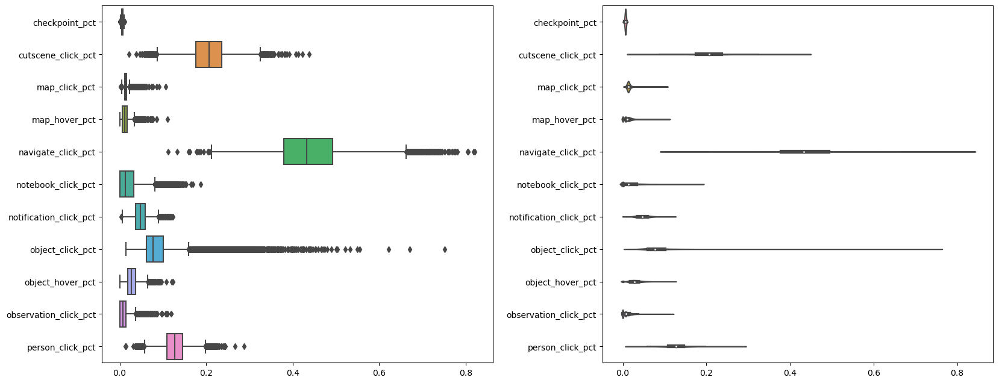

In [33]:
def get_the_pct_of_event_for_each_event_name(df):
    dfs = []
    temp = df.groupby(by = ["session_id", "event_name"])["index"].count()
    event_total = df.groupby(by = ["session_id"])["index"].count()
    event_names = temp.index.get_level_values(1).unique()
    for event_name in event_names:
        temp_by_event_name = temp.loc[:, event_name] / event_total
        temp_by_event_name = temp_by_event_name.rename(f"{event_name}_pct")
        dfs.append(temp_by_event_name)
    return dfs

print("\nThis function geneates the percentage for each `event_name` over all event")
print("Let's take a look at those features:")
train1 = train[train["level_group"] == "0-4"]
features_series = get_the_pct_of_event_for_each_event_name(train1)
features_df = to_df(features_series)
check_features(features_df)


This function geneates some basic aggregate statistics for numeric varaibles
Let's take a look at those features:


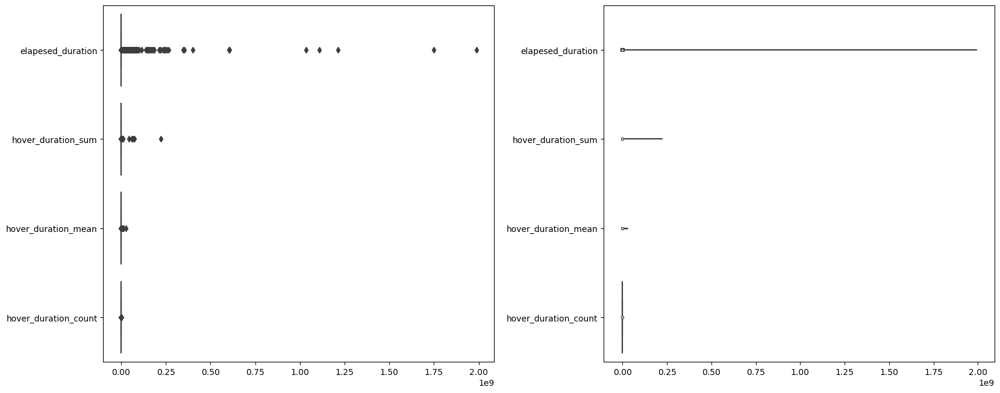

In [34]:
def get_basic_aggregate_statistics_for_numeric_varaibles(df):
    dfs = []
    
    temp = df.groupby(by = ["session_id"])["elapsed_time"].max() - df.groupby(by = ["session_id"])["elapsed_time"].min()
    temp = temp.rename("elapesed_duration")
    dfs.append(temp)
    
    temp = df.groupby(by = ["session_id"])["hover_duration"].sum()
    temp = temp.rename("hover_duration_sum")
    dfs.append(temp)
    
    temp = df.groupby(by = ["session_id"])["hover_duration"].mean().fillna(0)
    temp = temp.rename("hover_duration_mean")
    dfs.append(temp)
    
    temp = df.groupby(by = ["session_id"])["hover_duration"].count()
    temp = temp.rename("hover_duration_count")
    dfs.append(temp)
    
    return dfs

print("\nThis function geneates some basic aggregate statistics for numeric varaibles")
print("Let's take a look at those features:")
train1 = train[train["level_group"] == "0-4"]
features_series = get_basic_aggregate_statistics_for_numeric_varaibles(train1)
features_df = to_df(features_series)
check_features(features_df)


This function geneates some basic aggregate statistics for categorical varaibles: `page` and `level`
Let's take a look at those features:


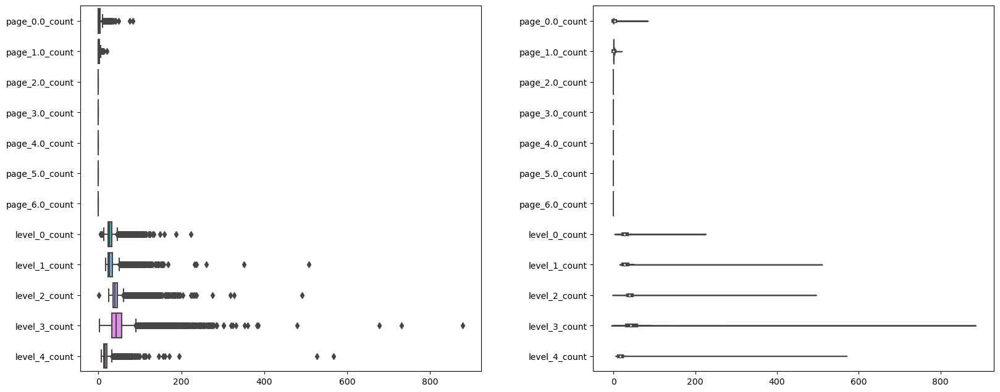

In [35]:
categorical_variables = ["page", "level"] 
def get_basic_aggregate_statistics_for_categorical_varaibles(df, categorical_variables):
    dfs = []
    for variable in categorical_variables:
        temp = df.groupby(by = ["session_id", variable])["index"].count()
        eles = temp.index.get_level_values(1).unique()
        for ele in eles:
            temp_by_ele = temp.loc[:, ele]
            temp_by_ele = temp_by_ele.rename(f"{variable}_{ele}_count")
            dfs.append(temp_by_ele)
    return dfs

print("\nThis function geneates some basic aggregate statistics for categorical varaibles: `page` and `level`")
print("Let's take a look at those features:")
train1 = train[train["level_group"] == "0-4"]
features_series = get_basic_aggregate_statistics_for_categorical_varaibles(train1, categorical_variables)
features_df = to_df(features_series)
check_features(features_df)

Let's use the function above to generate some aggregate statistics for other categorical varaibles: `event_name` and `name`


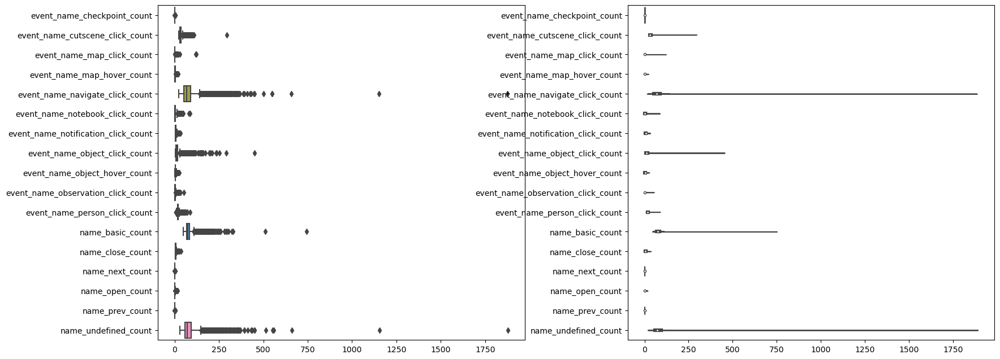

In [36]:
print("Let's use the function above to generate some aggregate statistics for other categorical varaibles: `event_name` and `name`")
train1 = train[train["level_group"] == "0-4"]
categorical_variables = ["event_name", "name"] 
features_series = get_basic_aggregate_statistics_for_categorical_varaibles(train1, categorical_variables)
features_df = to_df(features_series)
check_features(features_df)

Let's use the game config data (`fullscreen', `hq`, `music`) as features.


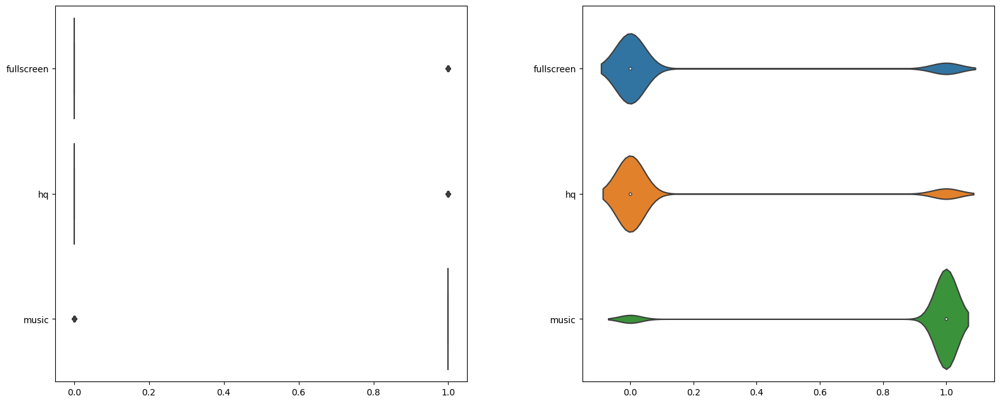

In [37]:
def get_game_config_data(df):
    dfs = []
    for game_config in ["fullscreen", "hq", "music"]:
        temp = df.groupby(by = ["session_id"])[game_config].first()
        temp.rename(game_config)
        dfs.append(temp)
    return dfs

print("Let's use the game config data (`fullscreen', `hq`, `music`) as features.")
train1 = train[train["level_group"] == "0-4"]
categorical_variables = ["event_name", "name"] 
features_series = get_game_config_data(train1)
features_df = to_df(features_series)
check_features(features_df)

#### 

<h3 style="font-family: Verdana; font-size: 20px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: #FC796D; background-color: #ffffff;"><a style="text-decoration: none; color: #e06f64;" href="#toc">6.2 FEATURES TABLE</a></h3>



---

When we submit our model, we need to use the competition API. The competition API presents the questions and data to us in order of `level_group` - level segments 0-4, 5-12, and 13-22 are each provided in sequence, and we will be predicting the correctness of each segment's questions as they are presented. Therefore, we also split train data into 3 batches by `level_group` - level segments 0-4, 5-12, and 13-22, and then generate the features table for each train data batch.

In [38]:
def concat_features(df):
    dfs1 = get_the_pct_of_event_for_each_event_name(df)
    dfs2 =get_basic_aggregate_statistics_for_numeric_varaibles(df)
    categorical_variables = ["page", "level", "event_name", "name"]
    dfs3 = get_basic_aggregate_statistics_for_categorical_varaibles(df, categorical_variables)
    dfs4 = get_game_config_data(df)

    dfs_total = dfs1 + dfs2 + dfs3 + dfs4
    indepdent_varaibles = pd.concat(dfs_total,axis=1)
    indepdent_varaibles = indepdent_varaibles.reset_index()
    indepdent_varaibles = indepdent_varaibles.set_index('session_id')
    return indepdent_varaibles

print("\n...GENERATE FEATURES TABLES...\n")

train1 = train[train["level_group"] == "0-4"]
FEATURES1 = concat_features(train1)
print("\tFEATURES1 SUCCESSFULLY GENERATED")

train2 = train[train["level_group"] == "5-12"]
FEATURES2 = concat_features(train2)
print("\tFEATURES2 SUCCESSFULLY GENERATED")

train3 = train[train["level_group"] == "13-22"]
FEATURES3 = concat_features(train3)
print("\tFEATURES3 SUCCESSFULLY GENERATED")

print("\n...GENERATE FEATURES TABLES COMPLETE...")

del train, train1, train2, train3


...GENERATE FEATURES TABLES...

	FEATURES1 SUCCESSFULLY GENERATED
	FEATURES2 SUCCESSFULLY GENERATED
	FEATURES3 SUCCESSFULLY GENERATED

...GENERATE FEATURES TABLES COMPLETE...


In [39]:
print(f"\nThe shape of FEATURES1 is {FEATURES1.shape}")
print(f"The shape of FEATURES2 is {FEATURES2.shape}")
print(f"The shape of FEATURES3 is {FEATURES3.shape}")


The shape of FEATURES1 is (23562, 47)
The shape of FEATURES2 is (23562, 50)
The shape of FEATURES3 is (23562, 52)


#### 

<h3 style="font-family: Verdana; font-size: 20px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: #FC796D; background-color: #ffffff;"><a style="text-decoration: none; color: #e06f64;" href="#toc">6.3 TARGETS TABLE</a></h3>



---
* The target variable is whether the players answered questions correctly at first attempt.
* We have 18 questions to be predicted.
    * question 1 ~ 3 will be predicted by the first batch of train data: Features1
    * question 4 ~ 13 will be predicted by second batch of train data: Features2
    * question 14 ~ 18 will be predicted by third batch of train data: Features3

In [42]:
def get_dependent_variable_matrix(df):
    df["question"] = df["session_id"].str.split("_").str[1].str[1:].astype(int)
    df["session"] = df["session_id"].str.split("_").str[0]
    return df

TARGETS = get_dependent_variable_matrix(train_labels)
print(f"The shape of TARGETS {TARGETS.shape}")
TARGETS

The shape of TARGETS (424116, 4)


,session_id,correct,question,session
0,20090312431273200_q1,1,1,20090312431273200
1,20090312433251036_q1,0,1,20090312433251036
2,20090312455206810_q1,1,1,20090312455206810
3,20090313091715820_q1,0,1,20090313091715820
4,20090313571836404_q1,1,1,20090313571836404
...,...,...,...,...
424111,22100215342220508_q18,1,18,22100215342220508
424112,22100215460321130_q18,1,18,22100215460321130
424113,22100217104993650_q18,1,18,22100217104993650
424114,22100219442786200_q18,1,18,22100219442786200


<br>

<a id="models"></a>

<h1 style="font-family: Verdana; font-size: 24px; font-style: normal; font-weight: bold; text-decoration: none; text-transform: none; letter-spacing: 3px; background-color: #ffffff; color: #FC796D;" id="models">7&nbsp;&nbsp;BASELINE MODELS&nbsp;&nbsp;&nbsp;&nbsp;<a style="text-decoration: none; color: #e06f64;" href="#toc">&#10514;</a></h1>

<br>

#### 

<h3 style="font-family: Verdana; font-size: 20px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: #FC796D; background-color: #ffffff;"><a style="text-decoration: none; color: #e06f64;" href="#toc">7.1 XGBOOST</a></h3>

---
* <a href = "https://www.kaggle.com/code/cdeotte/xgboost-baseline-0-680#XGBoost-Baseline---LB-0.678">This notebook</a> provides a baseline XGB model
* <a href = "https://www.kaggle.com/code/philculliton/basic-submission-demo/notebook">This notebook</a> provides a submission demo

In [46]:
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold
import xgboost as xgb
import warnings

MODELS = {}
F1 = {}
parameters = {
#     'max_depth': [2, 3, 4], 
#     'n_estimators': [20, 50, 100],
#     'learning_rate': [0.01, 0.05, 0.1]
    'max_depth': [1, 2]
}

for question in range(1, 19):
    print(f'\nTRAIN QUESTION {question} MODEL')
    
    if question <= 3:
        X = FEATURES1
    elif question <= 13:
        X = FEATURES2
    elif question <= 18:
        X = FEATURES3
    y = TARGETS[TARGETS["question"] == question]["correct"]

    model_xgb = xgb.XGBClassifier(random_state = 1)
    model_xgb = GridSearchCV(
        model_xgb, 
        parameters, 
        cv=2,
        scoring='f1')
    model_xgb.fit(X, y)
    
    MODELS[f"question {question} model"] = model_xgb
    F1[f"question {question} f1"] = model_xgb.best_score_
    print(f"\tf1 score is {model_xgb.best_score_:.3f}")
    print(f"\tbest params are {model_xgb.best_params_}")
    print(f'QUESTION {question} MODEL COMPLETE')


TRAIN QUESTION 1 MODEL
	f1 score is 0.841
	best params are {'max_depth': 1}
QUESTION 1 MODEL COMPLETE

TRAIN QUESTION 2 MODEL
	f1 score is 0.989
	best params are {'max_depth': 1}
QUESTION 2 MODEL COMPLETE

TRAIN QUESTION 3 MODEL
	f1 score is 0.966
	best params are {'max_depth': 1}
QUESTION 3 MODEL COMPLETE

TRAIN QUESTION 4 MODEL
	f1 score is 0.889
	best params are {'max_depth': 1}
QUESTION 4 MODEL COMPLETE

TRAIN QUESTION 5 MODEL
	f1 score is 0.692
	best params are {'max_depth': 1}
QUESTION 5 MODEL COMPLETE

TRAIN QUESTION 6 MODEL
	f1 score is 0.874
	best params are {'max_depth': 1}
QUESTION 6 MODEL COMPLETE

TRAIN QUESTION 7 MODEL
	f1 score is 0.845
	best params are {'max_depth': 1}
QUESTION 7 MODEL COMPLETE

TRAIN QUESTION 8 MODEL
	f1 score is 0.756
	best params are {'max_depth': 1}
QUESTION 8 MODEL COMPLETE

TRAIN QUESTION 9 MODEL
	f1 score is 0.847
	best params are {'max_depth': 2}
QUESTION 9 MODEL COMPLETE

TRAIN QUESTION 10 MODEL
	f1 score is 0.636
	best params are {'max_depth'

In [48]:
#conda install -c conda-forge xgboost
#conda update -n base -c defaults conda


<br>

<a id="submission"></a>

<h1 style="font-family: Verdana; font-size: 24px; font-style: normal; font-weight: bold; text-decoration: none; text-transform: none; letter-spacing: 3px; background-color: #ffffff; color: #FC796D;" id="submission">8&nbsp;&nbsp;SUBMISSION&nbsp;&nbsp;&nbsp;&nbsp;<a style="text-decoration: none; color: #e06f64;" href="#toc">&#10514;</a></h1>

<br>

In [49]:
# The iter_test can be called twice by the code below, thanks for @SERGEY BRYANSKY
# https://www.kaggle.com/competitions/predict-student-performance-from-game-play/discussion/384814
try:
    env = jo_wilder.make_env()
    iter_test = env.iter_test()
    print("env made!")
except:
    jo_wilder.make_env.__called__ = False
    type(env)._state = type(type(env)._state).__dict__['INIT']
    env = jo_wilder.make_env()
    iter_test = env.iter_test()
    print("env re made!")

NameError: name 'jo_wilder' is not defined

In [47]:
batch = 1
for (test, sample_submission) in iter_test:
    X_test = concat_features(test)
    all_y_pred = []
    
    if batch%3 == 1:
        for question in ["1", "2", "3"]:
            y_pred = MODELS[f"question {question} model"].predict(X_test).tolist()
            all_y_pred.extend(y_pred)
    elif batch%3 == 2:
        for question in ["4", "5", "6", "7", "8", "9", "10", "11", "12", "13"]:
            y_pred = MODELS[f"question {question} model"].predict(X_test).tolist()
            all_y_pred.extend(y_pred)
    elif batch%3 == 0:
        for question in ["14", "15", "16", "17", "18"]:
            y_pred = MODELS[f"question {question} model"].predict(X_test).tolist()
            all_y_pred.extend(y_pred)
     
    sample_submission['correct'] = all_y_pred
    env.predict(sample_submission)
    
    batch += 1


NameError: name 'iter_test' is not defined

In [ ]:
df = pd.read_csv("submission.csv")
df